
# Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
cd /content/drive/Shareddrives/DL_project/

/content/drive/Shareddrives/DL_project


In [3]:
from NST import StyleTransfer, create_gif
from IPython.display import display, Image

# Importing Images

In [4]:
content_image1 = '/content/drive/Shareddrives/DL_project/final_images/content/figures.jpg'
content_image2 = '/content/drive/Shareddrives/DL_project/final_images/content/lion.jpg'
content_image3 = '/content/drive/Shareddrives/DL_project/final_images/content/taj_mahal.jpg'

style_image1 = '/content/drive/Shareddrives/DL_project/final_images/styles/Tsunami_by_hokusai_19th_century.jpg'
style_image2 = '/content/drive/Shareddrives/DL_project/final_images/styles/mosaic.jpg'
style_image3 = '/content/drive/Shareddrives/DL_project/final_images/styles/vg_starry_night.jpg'
style_image4 = '/content/drive/Shareddrives/DL_project/final_images/styles/wave_crop.jpg'

# Experiment 3

# VGG MODEL


In this experiment we will modify the style layers and visualize the changes in the output image. The VGG model has 36 layers out of which some are just the activation layers. So we must be careful about the layer selection. Our class for Neural Style Transfer includes methods for setting custom selection for layers and layer weights.

```
Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (19): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (20): ReLU(inplace=True)
  (21): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (22): ReLU(inplace=True)
  (23): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (24): ReLU(inplace=True)
  (25): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (26): ReLU(inplace=True)
  (27): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (28): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (29): ReLU(inplace=True)
  (30): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (31): ReLU(inplace=True)
  (32): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (33): ReLU(inplace=True)
  (34): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (35): ReLU(inplace=True)
  (36): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)
```

![Model Architecture](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*Q_bg1E3trWcjdk9_jnVGwg.png)

## Experiment 3.1

In [ ]:
layers = {'0': 'conv1_1',
                    '5': 'conv2_1',
                    '10': 'conv3_1',
                    '19': 'conv4_1',
                    '21': 'conv4_2',  ## content representation
                    '28': 'conv5_1'}

layers_weights = {'conv1_1': 1.,
                 'conv2_1': 1,
                 'conv3_1': 1,
                 'conv4_1': 1,
                 'conv5_1': 1}

### Experiment 3.1.1

In [ ]:
obj = StyleTransfer(content_image1, style_image1)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:06<00:00, 85.5MB/s]


Model Fetched


In [ ]:
exp_name = "Experiment3.1.1"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4998/5000 [07:32<00:00, 11.24it/s]

Epoch:  5000
Total loss:  598704.3125


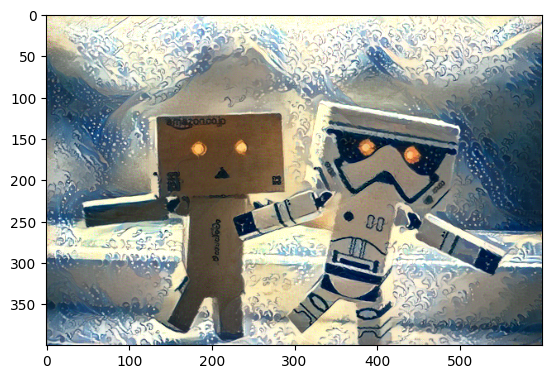

100%|██████████| 5000/5000 [07:33<00:00, 11.02it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

### Experiment 3.1.2

In [ ]:
obj = StyleTransfer(content_image2, style_image2)

Model Fetched


In [ ]:
exp_name = "Experiment3.1.2"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4999/5000 [05:22<00:00, 15.99it/s]

Epoch:  5000
Total loss:  642489.9375


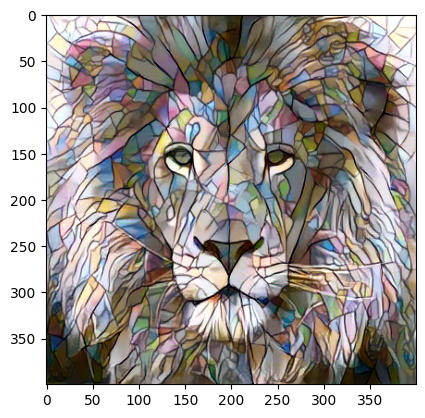

100%|██████████| 5000/5000 [05:23<00:00, 15.47it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

### Experiment 3.1.3

In [ ]:
obj = StyleTransfer(content_image3, style_image3)

Model Fetched


In [ ]:
exp_name = "Experiment3.1.3"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4999/5000 [07:19<00:00, 11.69it/s]

Epoch:  5000
Total loss:  242782.484375


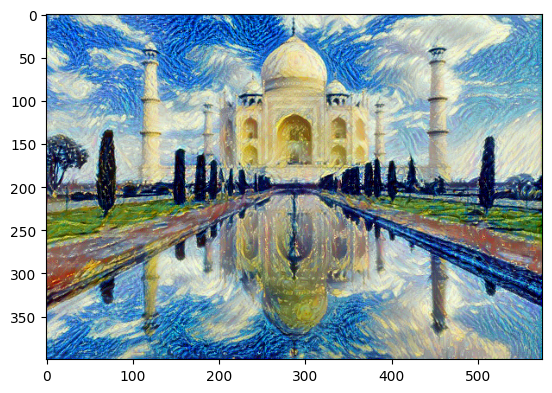

100%|██████████| 5000/5000 [07:20<00:00, 11.34it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

## Experiment 3.2

In [ ]:
layers = {
    '0': 'conv1_1',
    '5': 'conv2_1',
    '10': 'conv3_1',
    '19': 'conv4_1',
    '21': 'conv4_2',
    '28': 'conv5_1'
}

layers_weights = {
    'conv1_1': 1.0,
    'conv2_1': 0.0,
    'conv3_1': 0.0,
    'conv4_1': 0.0,
    'conv5_1': 1.0
}


### Experiment 3.2.1

In [ ]:
obj = StyleTransfer(content_image1, style_image1)

Model Fetched


In [ ]:
exp_name = "Experiment3.2.1"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4999/5000 [07:37<00:00, 11.32it/s]

Epoch:  5000
Total loss:  20651.1640625


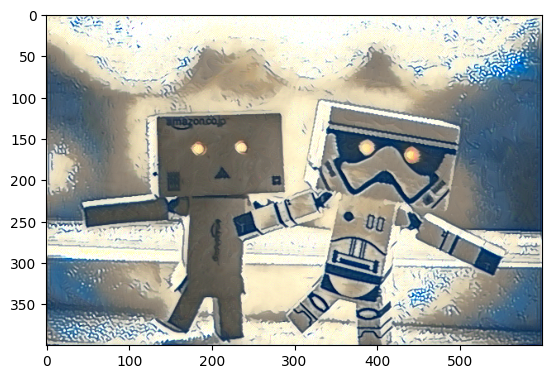

100%|██████████| 5000/5000 [07:38<00:00, 10.91it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

### Experiment 3.2.2

In [ ]:
obj = StyleTransfer(content_image2, style_image2)

Model Fetched


In [ ]:
exp_name = "Experiment3.2.2"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4998/5000 [05:21<00:00, 16.04it/s]

Epoch:  5000
Total loss:  19150.845703125


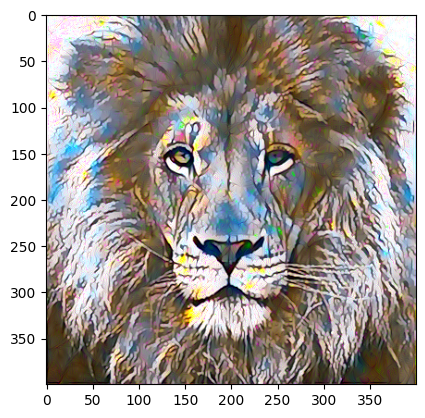

100%|██████████| 5000/5000 [05:22<00:00, 15.51it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

### Experiment 3.2.3

In [ ]:
obj = StyleTransfer(content_image3, style_image3)

Model Fetched


In [ ]:
exp_name = "Experiment3.2.3"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4999/5000 [07:20<00:00, 11.73it/s]

Epoch:  5000
Total loss:  11616.263671875


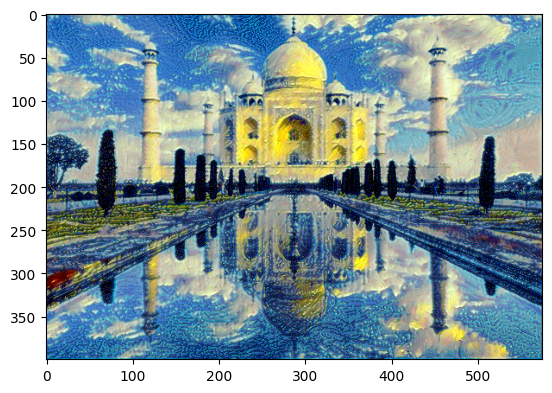

100%|██████████| 5000/5000 [07:21<00:00, 11.33it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

## Experiment 3.3

In [ ]:
layers = {
    '0': 'conv1_1',
    '5': 'conv2_1',
    '10': 'conv3_1',
    '19': 'conv4_1',
    '21': 'conv4_2',
    '28': 'conv5_1'
}

layers_weights = {
    'conv1_1': 0.0,
    'conv2_1': 1.0,
    'conv3_1': 1.0,
    'conv4_1': 1.0,
    'conv5_1': 0.0
}

### Experiment 3.3.1

In [ ]:
obj = StyleTransfer(content_image1, style_image1)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:05<00:00, 100MB/s]


Model Fetched


In [ ]:
exp_name = "Experiment3.3.1"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4999/5000 [08:58<00:00, 11.34it/s]

Epoch:  5000
Total loss:  260229.359375


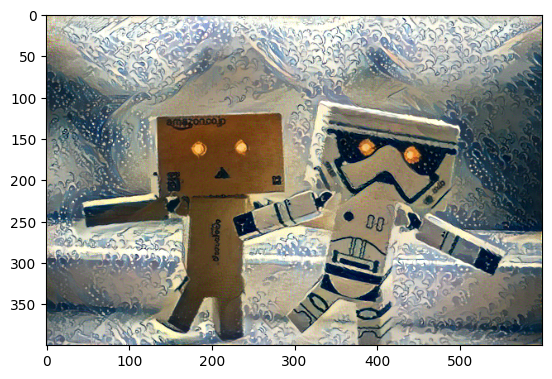

100%|██████████| 5000/5000 [09:00<00:00,  9.26it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

### Experiment 3.3.2

In [ ]:
obj = StyleTransfer(content_image2, style_image2)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 144MB/s]


Model Fetched


In [ ]:
exp_name = "Experiment3.3.2"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4998/5000 [05:42<00:00, 16.10it/s]

Epoch:  5000
Total loss:  452888.90625


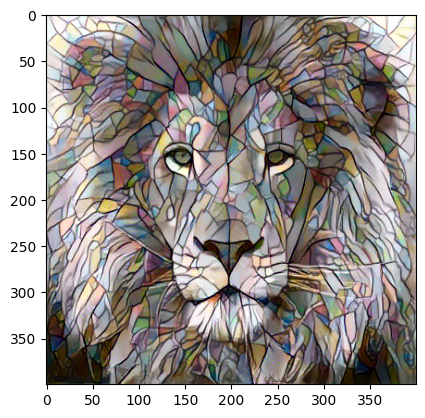

100%|██████████| 5000/5000 [05:44<00:00, 14.53it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

### Experiment 3.3.3

In [ ]:
obj = StyleTransfer(content_image3, style_image3)

Model Fetched


In [ ]:
exp_name = "Experiment3.3.3"
obj.set_exp(exp_name)
obj.set_layers(layers)
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4998/5000 [07:49<00:00, 11.49it/s]

Epoch:  5000
Total loss:  73507.25


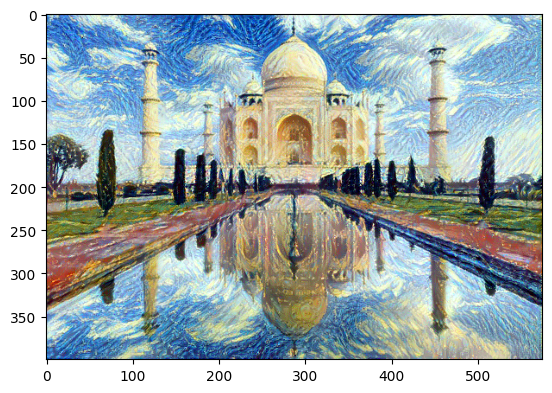

100%|██████████| 5000/5000 [07:51<00:00, 10.61it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

In [ ]:
display(Image(filename="Outputs/{}/gif.gif".format(exp_name)))

Output hidden; open in https://colab.research.google.com to view.

# Alexnet



AlexNet is a significant and influential neural network architecture that was developed by Alex Krizhevsky, Ilya Sutskever, and Geoffrey Hinton. It was introduced in 2012 in their paper titled "ImageNet Classification with Deep Convolutional Neural Networks". It was one of the first models to extensively use the RELU activation function.

```
Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Ma
)
```
![Model Architecture](https://www.mdpi.com/remotesensing/remotesensing-09-00848/article_deploy/html/images/remotesensing-09-00848-g002.png)

In [11]:
from torchvision.models import alexnet

alexnet = alexnet(pretrained=True)


# print(model.features)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 101MB/s]


## Experiment 3.4


In [ ]:
layers = {'0': 'conv1',
                    '3': 'conv2',
                    '6': 'conv3',
                    '8': 'conv4',
                    '10': 'conv5'}

layers_weights = {'conv1': 1.,
                 'conv2': 1,
                 'conv3': 1,
                 'conv4': 1,
                 'conv5': 1}

### Experiment 3.4.1

In [ ]:
obj = StyleTransfer(content_image3, style_image3)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:05<00:00, 113MB/s] 


Model Fetched


In [ ]:
exp_name = "Experiment3.4.1"
obj.set_exp(exp_name)
obj.set_model(alexnet.features)
obj.set_layers(layers)
obj.set_content_loss_layer('conv5')
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4983/5000 [00:40<00:00, 137.34it/s]

Epoch:  5000
Total loss:  12346.818359375


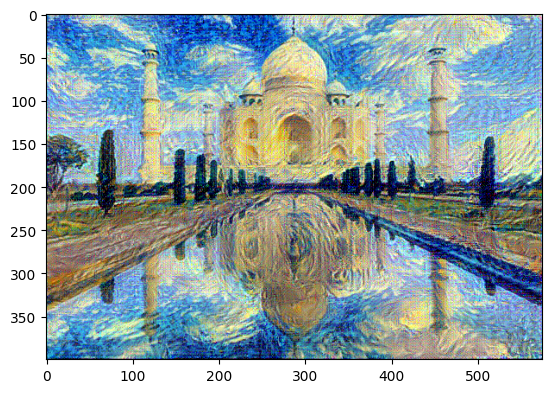

100%|██████████| 5000/5000 [00:41<00:00, 120.89it/s]


In [ ]:
obj.run()

In [ ]:
create_gif(exp_name)

### Experiment 3.4.2

In [ ]:
layers = {'0': 'conv1',
                    '3': 'conv2',
                    '6': 'conv3',
                    '8': 'conv4',
                    '10': 'conv5'}

layers_weights = {'conv1': 1.0,
                 'conv2': 0.0,
                 'conv3': 0.0,
                 'conv4': 0.0,
                 'conv5': 1.0}

In [ ]:
obj = StyleTransfer(content_image3, style_image3)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model Fetched


In [ ]:
exp_name = "Experiment3.4.2"
obj.set_exp(exp_name)
obj.set_model(alexnet.features)
obj.set_layers(layers)
obj.set_content_loss_layer('conv5')
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4984/5000 [00:40<00:00, 130.46it/s]

Epoch:  5000
Total loss:  828.9135131835938


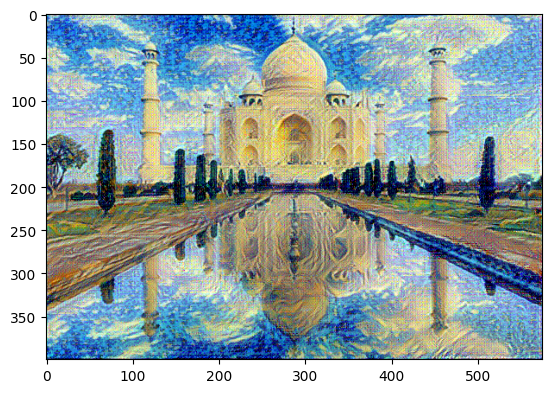

100%|██████████| 5000/5000 [00:41<00:00, 120.58it/s]


In [ ]:
exp_name = "Experiment3.4.2_e5000"
obj.set_exp(exp_name)
obj.run(steps=5000)

In [ ]:
# exp_name = "Experiment3.4.2_e20000"
# obj.set_exp(exp_name)
# obj.run(steps=20000)

In [ ]:
create_gif(exp_name)

### Experiment  3.4.3

In [ ]:
layers_weights = {'conv1': 0.0,
                 'conv2': 1.0,
                 'conv3': 1.0,
                 'conv4': 1.0,
                 'conv5': 0.0}

In [ ]:
# alpha=0
# beta=1e5

In [ ]:
obj = StyleTransfer(content_image3, style_image3)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model Fetched


In [ ]:
exp_name = "Experiment3.4.3"
obj.set_exp(exp_name)
obj.set_model(alexnet.features)
obj.set_layers(layers)
obj.set_content_loss_layer('conv5')
obj.set_layer_weights(layers_weights)

In [ ]:
obj.show_images()

Output hidden; open in https://colab.research.google.com to view.

Starting Training


100%|█████████▉| 4986/5000 [00:44<00:00, 135.08it/s]

Epoch:  5000
Total loss:  5631.7763671875


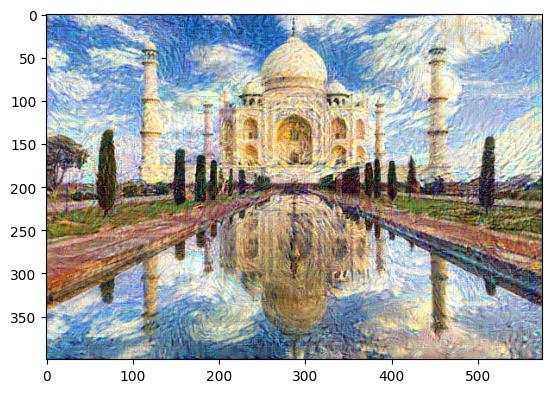

100%|██████████| 5000/5000 [00:44<00:00, 111.31it/s]


In [ ]:
obj.run()

Starting Training


100%|█████████▉| 19997/20000 [02:06<00:00, 171.86it/s]

Epoch:  20000
Total loss:  1793.2593994140625


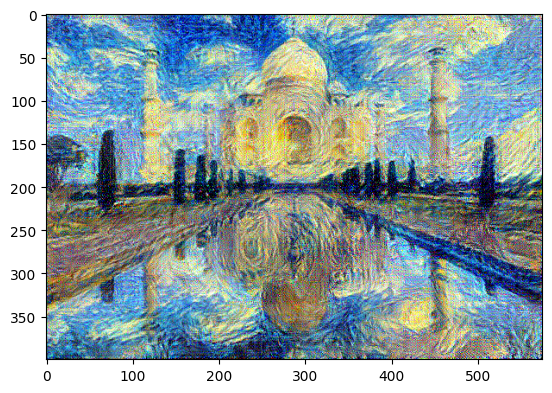

100%|██████████| 20000/20000 [02:07<00:00, 157.21it/s]


In [ ]:
obj.run(steps=20000,alpha=alpha,beta=beta)

Starting Training


100%|█████████▉| 49985/50000 [04:57<00:00, 177.65it/s]

Epoch:  50000
Total loss:  1372.1053466796875


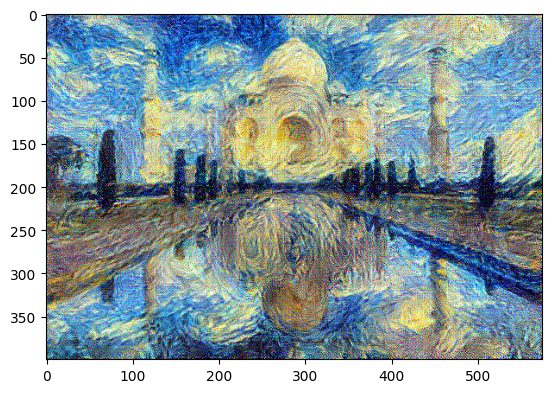

100%|██████████| 50000/50000 [04:58<00:00, 167.74it/s]


In [ ]:
obj.run(steps=50000,alpha=alpha,beta=beta)

In [ ]:
create_gif(exp_name)

## Experiment 3.5


In [12]:
layers = {'0': 'conv1',
                    '3': 'conv2',
                    '6': 'conv3',
                    '8': 'conv4',
                    '10': 'conv5'}

layers_weights = {'conv1': 1.,
                 'conv2': 1,
                 'conv3': 1,
                 'conv4': 1,
                 'conv5': 1}

### Experiment 3.5.1

In [13]:
obj = StyleTransfer(content_image2, style_image2)

Model Fetched


In [14]:
exp_name = "Experiment3.5.1"
obj.set_exp(exp_name)
obj.set_model(alexnet.features)
obj.set_layers(layers)
obj.set_content_loss_layer('conv5')
obj.set_layer_weights(layers_weights)

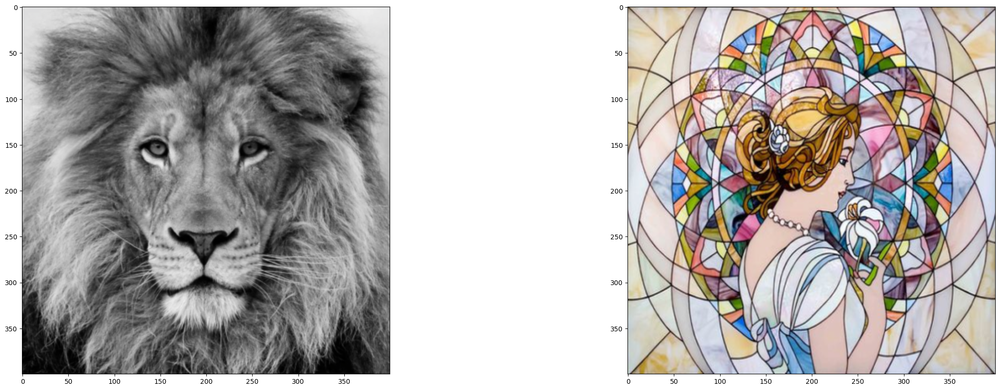

In [15]:
obj.show_images()

Starting Training


100%|█████████▉| 4988/5000 [00:29<00:00, 172.91it/s]

Epoch:  5000
Total loss:  44334.75390625


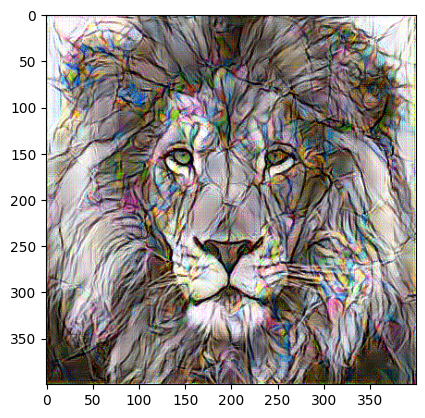

100%|██████████| 5000/5000 [00:29<00:00, 167.11it/s]


In [16]:
obj.run()

In [17]:
create_gif(exp_name)

### Experiment 3.5.2

In [18]:
layers = {'0': 'conv1',
                    '3': 'conv2',
                    '6': 'conv3',
                    '8': 'conv4',
                    '10': 'conv5'}

layers_weights = {'conv1': 1.0,
                 'conv2': 0.0,
                 'conv3': 0.0,
                 'conv4': 0.0,
                 'conv5': 1.0}

In [19]:
obj = StyleTransfer(content_image2, style_image2)

Model Fetched


In [20]:
exp_name = "Experiment3.5.2"
obj.set_exp(exp_name)
obj.set_model(alexnet.features)
obj.set_layers(layers)
obj.set_content_loss_layer('conv5')
obj.set_layer_weights(layers_weights)

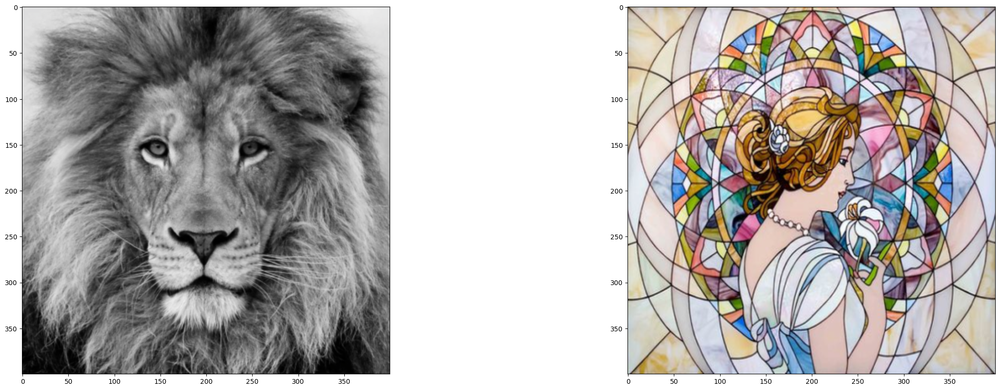

In [21]:
obj.show_images()

Starting Training


100%|█████████▉| 4988/5000 [01:06<00:00, 86.78it/s]

Epoch:  5000
Total loss:  776.9140014648438


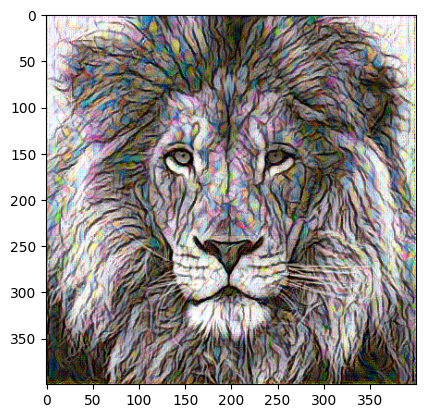

100%|██████████| 5000/5000 [01:07<00:00, 73.96it/s]


In [22]:
exp_name = "Experiment3.4.2_e5000"
obj.set_exp(exp_name)
obj.run(steps=5000)

In [23]:
# exp_name = "Experiment3.4.2_e20000"
# obj.set_exp(exp_name)
# obj.run(steps=20000)

In [24]:
create_gif(exp_name)

### Experiment  3.5.3

In [33]:
layers_weights = {'conv1': 0.0,
                 'conv2': 1.0,
                 'conv3': 1.0,
                 'conv4': 1.0,
                 'conv5': 0.0}

In [26]:
# alpha=0
# beta=1e5

In [34]:
obj = StyleTransfer(content_image2, style_image2)

Model Fetched


In [35]:
exp_name = "Experiment3.5.3"
obj.set_exp(exp_name)
obj.set_model(alexnet.features)
obj.set_layers(layers)
obj.set_content_loss_layer('conv5')
obj.set_layer_weights(layers_weights)

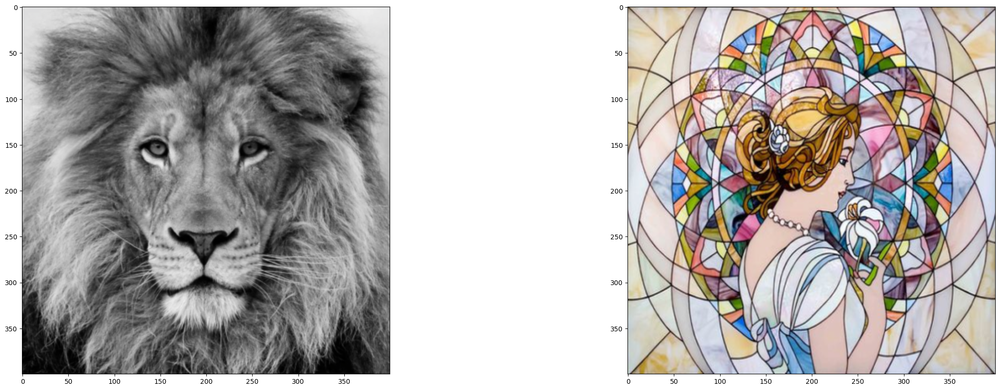

In [36]:
obj.show_images()

Starting Training


100%|█████████▉| 4978/5000 [00:28<00:00, 201.26it/s]

Epoch:  5000
Total loss:  31518.00390625


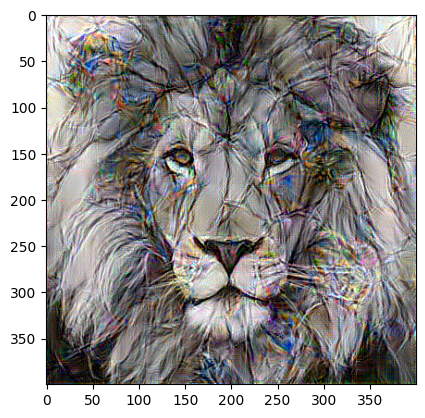

100%|██████████| 5000/5000 [00:29<00:00, 172.39it/s]


In [37]:
obj.run()